# Standardize Data

This jupyter notebook contains the code for standardizing the audio data.
The following properties of the audio will be standardized:

* Frame Rate
* Number of audio channels
* Normalization of audio
* Length of audio files

Most of the processing is done using the *Pydub* python package Let's get started

In [1]:
import numpy as np
import IPython
from pydub import AudioSegment
import os
import matplotlib.pyplot as plt
from scipy.io import wavfile
import pydub
%matplotlib inline

C:\Users\Babban\AppData\Local\conda\conda\envs\tensorflow\lib\site-packages\pydub\utils.py:165: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)


### Read File
The following function will read the input data for us. Right now only wav, flv, mp3 and ogg files are supported

In [2]:
def read_file(filename):
    if filename.endswith("wav"):
        return AudioSegment.from_wav(filename)
    elif filename.endswith("flv"):
        return AudioSegment.from_wav(filename)
    elif filename.endswith("ogg"):
        return AudioSegment.from_ogg(filename)
    elif filename.endswith("mp3"):
        return AudioSegment.from_mp3(filename)
    else:
        raise Exception("File not supported. Check if file extension in included in filename")

In [3]:
# Load an audio file, which we will use for demonstration
f = read_file("01.wav")

### Set Rate
Following function takes two args.:
* audio - pydub.Audiosegment object
* rate - integer

It sets the rate of audio to `rate`.

In [4]:
def set_rate(audio, rate):
    return audio.set_frame_rate(rate)

In [5]:
# Let's see it's effect on our sample
# Changing frame rate of data
print("Original frame rate of data: "+ str(f.frame_rate))
print("Altered frame rate of data: "+ str(set_rate(f, 22050).frame_rate))

Original frame rate of data: 44100
Altered frame rate of data: 22050


### Set Channels
Following function takes two args.:
* audio - pydub.Audiosegment object
* nChannel - integer

It sets the channels of audio to nChannel

In [6]:
def set_audio_channels(audio, nChannel):
    return audio.set_channels(1)

In [7]:
# Changing the number of channels of our sample
print("Number of channels in original data: "+ str(f.channels))
print("New number of channels: "+ str(set_audio_channels(f, 1).channels))

Number of channels in original data: 2
New number of channels: 1


### Normalize audio
The following function takes *pydub.Audiosegment* object as input. It then normalizes our audio data so that all of our data will have maximum a loudness of **0 decibel**.

It will help us to achieve consistent loudness in all of our audio data.

In [8]:
def normalize_audio(audio):
    return pydub.effects.normalize(audio)

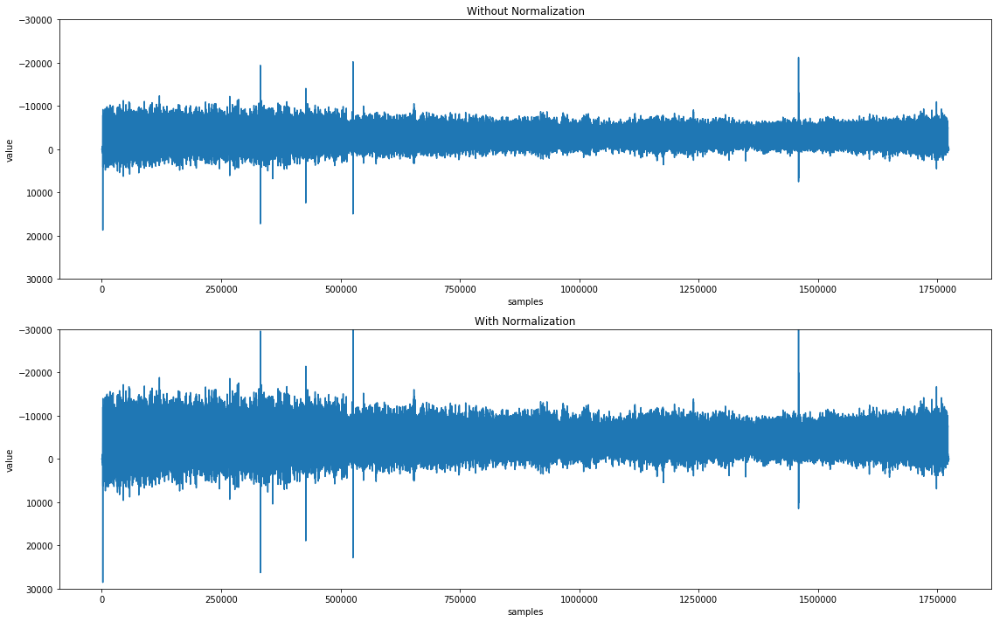

In [9]:
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(16, 10))
ax[0].plot(np.array(f.get_array_of_samples()))
ax[0].set_xlabel('samples')
ax[0].set_ylabel('value')
ax[0].set_title('Without Normalization')
ax[0].set_ylim((30000, -30000))
# ax[0].set_xlim((0, 75000))


ax[1].plot(np.array(normalize_audio(f).get_array_of_samples()))
ax[1].set_xlabel('samples')
ax[1].set_ylabel('value')
ax[1].set_title('With Normalization')
ax[1].set_ylim((30000, -30000))
# ax[1].set_xlim((0, 75000))

plt.tight_layout()

### standardize_data Function
The following functions takes the path of a supported audio file as an input and performs the following processing on our data:
1. Reads the audio file as *pydub.Audiosegment* object.
2. Standardize frame rate
3. Standardize number of channels
4. Normalize the data
5. Divide the data into standard size chunks and save them as `.wav` file at the specified location.

#### Arguments:
* filename - Full path to the audio file.
* rate - standard frame rate for data. Default: 44100.
* Nchannels - standard channels for data. Default: 1.
* chunk_size - length of output chunks in seconds. Default: 10
* target_location - path to directory where results will be stored. Default: "./standardized/"

In [10]:
def standardize_data(filename, rate=44100, nchannels=1, chunk_size=10, target_location="./standardized/"):
    f = read_file(filename)
    if f.frame_rate != rate:
        f = set_rate(f, rate)
    if f.channels != nchannels:
        f = set_audio_channels(f, nchannels)
    f = normalize_audio(f)
    j = 0
    if not os.path.exists(target_location):
        os.makedirs(target_location)
    
    while len(f[:]) >= chunk_size*1000:
        chunk = f[:chunk_size*1000]
        chunk.export(target_location+filename.strip().split('.')[0]+"_" + str(j)+ ".wav", format ="wav")
        print("File stored at "+ target_location+filename.strip().split('.')[0]+"_" + str(j)+ ".wav")
        f = f[chunk_size*1000:]
        j += 1
        
    if 0 < len(f[:]) and len(f[:]) < chunk_size*1000:
        silent = AudioSegment.silent(duration=chunk_size*1000)
        paddedData = silent.overlay(f, position=0, times=1)
        paddedData.export(target_location+filename.strip().split('.')[0]+"_" + str(j)+ ".wav", format ="wav")
        print("File stored at "+ target_location+filename.strip().split('.')[0]+"_" + str(j)+ ".wav")
    

In [11]:
# Now let's run our function on our file
standardize_data("01.wav")

File stored at ./standardized/01_0.wav
File stored at ./standardized/01_1.wav
File stored at ./standardized/01_2.wav


# Audio Scaling
In place of Normalization we can also use scaling. Scaling can sometimes help our Neural Network converge faster. I prefer to use scaling in preprocessing of data before training our model.

Also, I think the standardized data will be used in future for research purposes. So, I believe that altering the original data to this extent might not be a good idea.

In [12]:
# Plots spectrogram
def graph_spectrogram(wav_file):
    plt.figure(num=None, figsize=(10, 6), dpi=80, facecolor='w', edgecolor='k')
    rate, data = wavfile.read(wav_file)
    fig,ax = plt.subplots(1)
    fig.subplots_adjust(left=0,right=1,bottom=0,top=1)
    ax.axis('off')
    plt.set_cmap('magma')
    nchannels = data.ndim
    if nchannels ==1:
        pxx, freqs, bins, im = ax.specgram(x=data, Fs=rate, noverlap=120, NFFT=200)
    if nchannels ==2:
        pxx, freqs, bins, im = ax.specgram(x=data[:,0], Fs=100, noverlap=192, NFFT=256)
    ax.axis('off')
#     return pxx, freqs, bins,

**Spectrogram before scaling**

C:\Users\Babban\AppData\Local\conda\conda\envs\tensorflow\lib\site-packages\matplotlib\axes\_axes.py:7674: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


<Figure size 800x480 with 0 Axes>

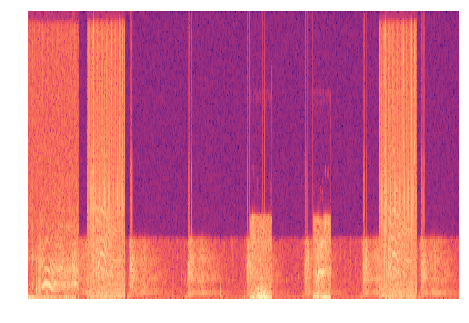

In [13]:
graph_spectrogram("04.wav")

**Now load the data again and scale it**

In [14]:
rate, data = wavfile.read("04.wav")

In [15]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
data = scaler.fit_transform(data)

C:\Users\Babban\AppData\Local\conda\conda\envs\tensorflow\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype int16 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


In [16]:
wavfile.write("scaledData.wav", rate=rate, data=data)

C:\Users\Babban\AppData\Local\conda\conda\envs\tensorflow\lib\site-packages\matplotlib\axes\_axes.py:7674: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


<Figure size 800x480 with 0 Axes>

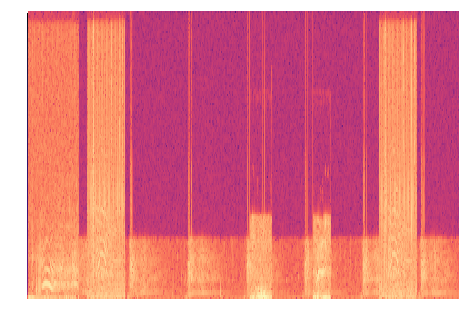

In [17]:
graph_spectrogram("scaledData.wav")

### Visualize results

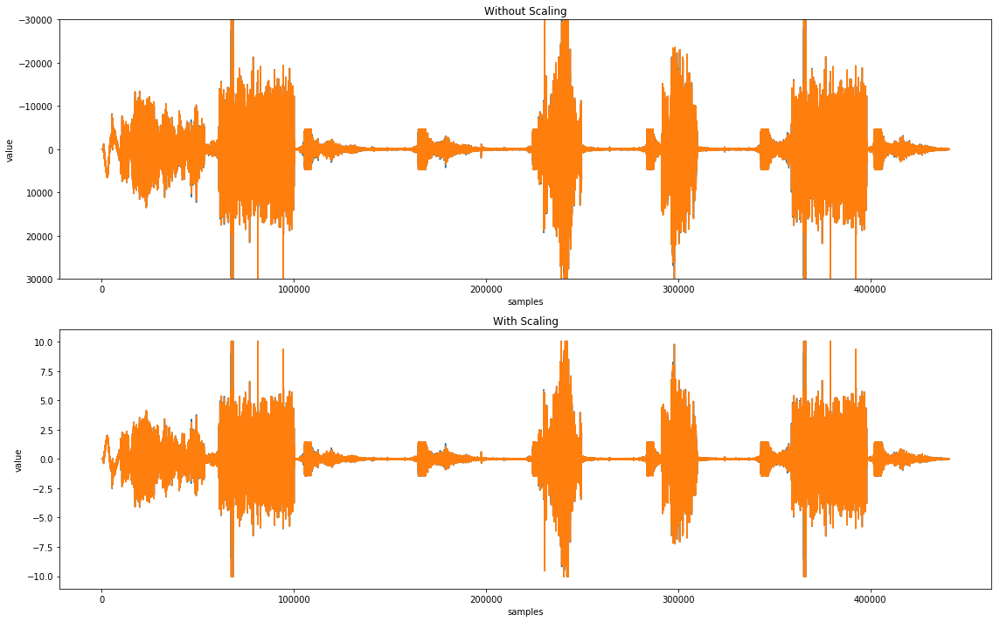

In [18]:
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(16, 10))
ax[0].plot(wavfile.read("04.wav")[1])
ax[0].set_xlabel('samples')
ax[0].set_ylabel('value')
ax[0].set_title('Without Scaling')
ax[0].set_ylim((30000, -30000))
# ax[0].set_xlim((0, 75000))


ax[1].plot(scaler.fit_transform(data))
ax[1].set_xlabel('samples')
ax[1].set_ylabel('value')
ax[1].set_title('With Scaling')
# ax[1].set_ylim((30000, -30000))
# ax[1].set_xlim((0, 75000))

plt.tight_layout()

## Hear original and scaled data

In [19]:
print("Original: ")
IPython.display.Audio("04.wav")

Original: 


In [20]:
print("Scaled: ")
IPython.display.Audio("scaledData.wav")

Scaled: 
